# DMI Metabolic Flux Model -- C6 Oxidative/Dilution Branch

This notebook accompanies `model_fittingC6_improved.py`. The C6 branch keeps the B6 fixed-`KT` plasma/input and reliability-weighted fitting machinery, but replaces the old branch-split voxel model with a direct oxidative-entry/dilution model.

Primary fitted parameters are: global plasma input parameters; tissue-level `eta`, `V_x`, and `fv`; and voxel-level `MR_glc`, `V_lac_loss`, `V_ox`, and `phi_tca`.

Deprecated aliases are retained only for compatibility: `V_lac = V_lac_source = MR_glc` and `V_out = V_lac_loss`. They are not the old B6 definitions.


# Model Notes

## Rationale

B6 used `f_lac` to force `V_ox = 2*MR_glc*(1-f_lac)`. C6 instead fits `V_ox` directly as the DMI-visible glucose-label-derived oxidative entry from the joint Lac/Pyr pool. Total effective TCA/Glx turnover is derived, not independently fitted.

## Parameter hierarchy

| Level | Parameters | Interpretation |
|---|---|---|
| Global mouse-week | `a1`, `plasma_delay_min`, `plasma_tau_rise`, `plasma_w`, `kp_slow`, `kp_gap` | fitted plasma labeled-glucose input shape |
| Tissue muscle | `eta`, `V_x`, `fv` | transport multiplier, K/Glx exchange, vascular glucose fraction |
| Voxel | `MR_glc`, `V_lac_loss`, `V_ox`, `phi_tca` | glucose label processing, Lac* clearance/dilution, glucose-derived oxidative entry, glucose-derived TCA fraction |

Derived quantities: `T_max = eta * MR_glc`, `V_TCA_total = V_ox / phi_tca`, and `V_dil_tca = V_TCA_total - V_ox`.

FBA-facing quantities should be `MR_glc` and `V_ox`. `V_lac_loss` is low-confidence label clearance/dilution, and `V_TCA_total`, `V_dil_tca`, and `phi_tca` are diagnostics rather than direct DMI-measured GEM constraints.


In [1]:
import sys
from pathlib import Path
from IPython.display import display

import joblib
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Patch
from scipy.stats import mannwhitneyu

NOTEBOOK_DIR = Path('/home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC')
if str(NOTEBOOK_DIR) not in sys.path:
    sys.path.insert(0, str(NOTEBOOK_DIR))

import model_fittingC6_improved as mf

DATA_DIR = mf.DATA_DIR
RESULTS_FILENAME_PHASE1 = mf.RESULTS_FILENAME_PHASE1
RESULTS_FILENAME = mf.RESULTS_FILENAME
MODEL_TAG = mf.MODEL_TAG
TISSUES = mf.TISSUES
WEEKS = mf.WEEKS
NX = mf.NX
NY = mf.NY
available_combos = mf.available_combos
hash_mouseID2group = mf.hash_mouseID2group
hash_mouseID2week2H1anatomical = mf.DATA['hash_mouseID2week2H1anatomical']

print(f'Using companion module: {MODEL_TAG}')
print(f'KT is fixed at {mf.KT_FIXED_MM} mM (literature value).')
print(f'Phase-1 output file: {RESULTS_FILENAME_PHASE1}')
print(f'Phase-2 output file: {RESULTS_FILENAME}')
print(f'Available (mouseID, week) combinations: {len(available_combos)}')


Using companion module: branch_split_noGly_vC6_jointPlasma_oxDilution_KTfixed
KT is fixed at 5.8 mM (literature value).
Phase-1 output file: fitC6a_results_MRI_fluxes_noGly_oxDilution_KTfixed.joblib.xz
Phase-2 output file: fitC6b_results_MRI_fluxes_AllTissues_noGly_oxDilution_KTfixed.joblib.xz
Available (mouseID, week) combinations: 16


In [2]:
mf.run_light_sanity_checks()

# Diagnostic objective evaluation on a known voxel set (matches v6 notebook).
diag_mid, diag_wk, diag_tissue = 54, 'w6', 'Gastrocnemius'
diag_roi = mf.get_expanded_roi(diag_tissue, diag_wk, diag_mid)
diag_vox = mf.extract_voxel_timeseries(diag_mid, diag_wk, diag_roi)
print(f'Diagnostic sample: Mouse {diag_mid} {diag_wk} {diag_tissue} -> {len(diag_vox)} voxels')
if diag_vox:
    diag_theta = mf.build_x0(diag_tissue, len(diag_vox))
    diag_cost = mf.joint_objective(diag_theta, diag_vox, dict(mf.FIXED_PARAMS))
    diag_quality = {
        key: mf.summarize_channel_quality(diag_vox[0][key], key)['reliability']
        for key in mf.FIT_MET_KEYS
    }
    print(f'Initial objective with reliability-aware multi-met loss (KT fixed): {diag_cost:.3f}')
    print(f'First diagnostic voxel reliability: {diag_quality}')


Sanity checks passed. Mouse 54 w6 Gastrocnemius initial objective=9.768 (KT fixed at 5.8 mM)
Diagnostic sample: Mouse 54 w6 Gastrocnemius -> 2 voxels
Initial objective with reliability-aware multi-met loss (KT fixed): 9.768
First diagnostic voxel reliability: {'glc': 1.0, 'lac': 0.681752914121834, 'glx': 1.0}


In [3]:
# Heavy two-phase fitting. Phase-1 fits each (mouse, week, tissue) independently
# (single-tissue, 9 shared params), then Phase-2 jointly fits all tissues for
# each (mouse, week) using Phase-1 estimates as the warm start. KT is a fixed
# constant in both phases.
phase1_results, all_results = mf.run_two_phase_fitting()


Loaded 47 Phase-1 results from /home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC/fitC6a_results_MRI_fluxes_noGly_oxDilution_KTfixed.joblib.xz
Phase 1: 47 done, 1 remaining -- 1 workers.
  [P1 47/48] Mouse 47 w3 TibialisAnt
Phase 1 complete -- 47 tissue fits.
Loaded 16 Phase-2 results from /home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC/fitC6b_results_MRI_fluxes_AllTissues_noGly_oxDilution_KTfixed.joblib.xz
Phase 2: 16 done, 0 remaining -- 1 workers.
All fits complete. 16 joint results saved to /home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC/fitC6b_results_MRI_fluxes_AllTissues_noGly_oxDilution_KTfixed.joblib.xz


In [4]:

N_mouse_week_tissues = 0
for result in all_results:
    N_mouse_week_tissues += len(result['tissues'])
    if len(result['tissues']) != 3:
        print(f"Mouse {result['mouseID']} {result['week']} has {len(result['tissues'])} tissues: {result['tissues'].keys()} group: {result['group']}")
        pass
        # print(list(result['tissues'].keys()))


Mouse 47 w3 has 2 tissues: dict_keys(['Gastrocnemius', 'Soleus']) group: dia


Loaded 16 joint results; using 13 successful results for summaries.
Fitted 47 mouse-week-tissue combinations across both phases.
Excluded from summary: mouse 52 w6, mouse 53 basal, mouse 48 w3
Plotting time-course fits for 13 successful (mouse, week) results...


/tmp/ipykernel_95296/3103996002.py:108: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


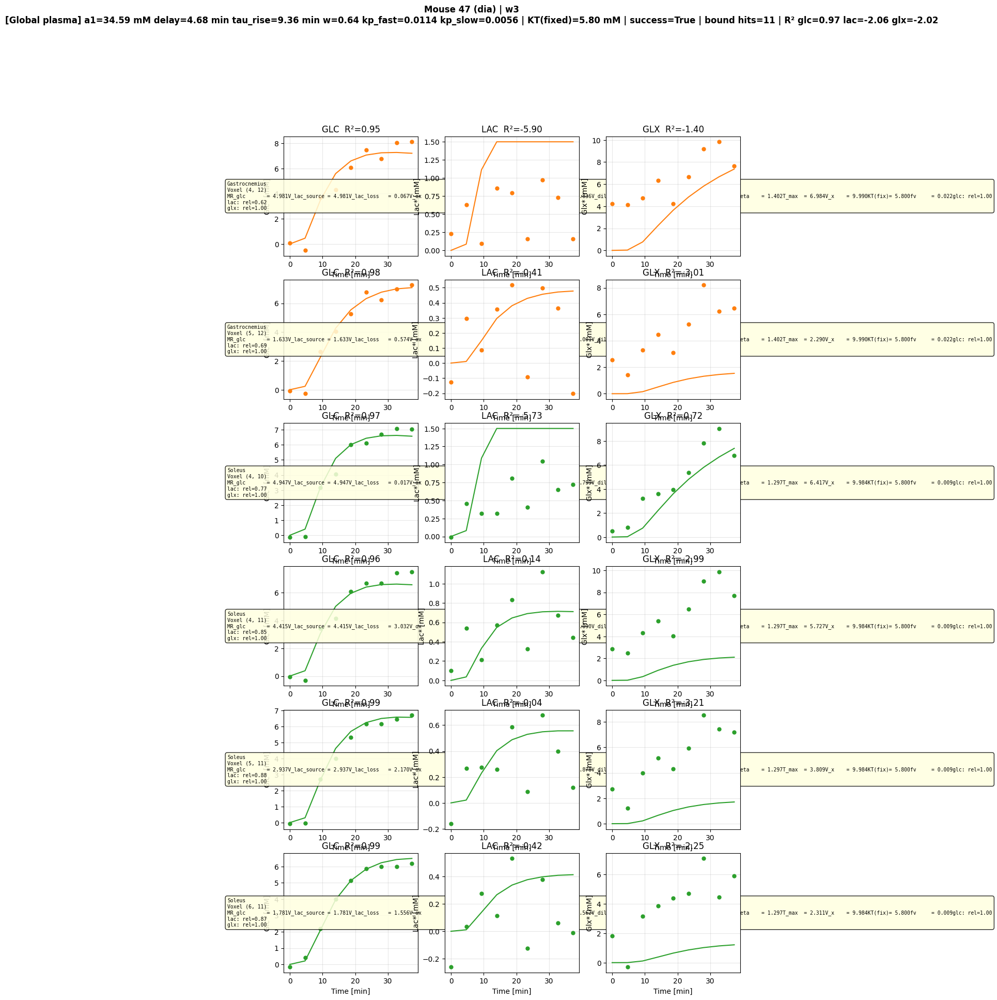

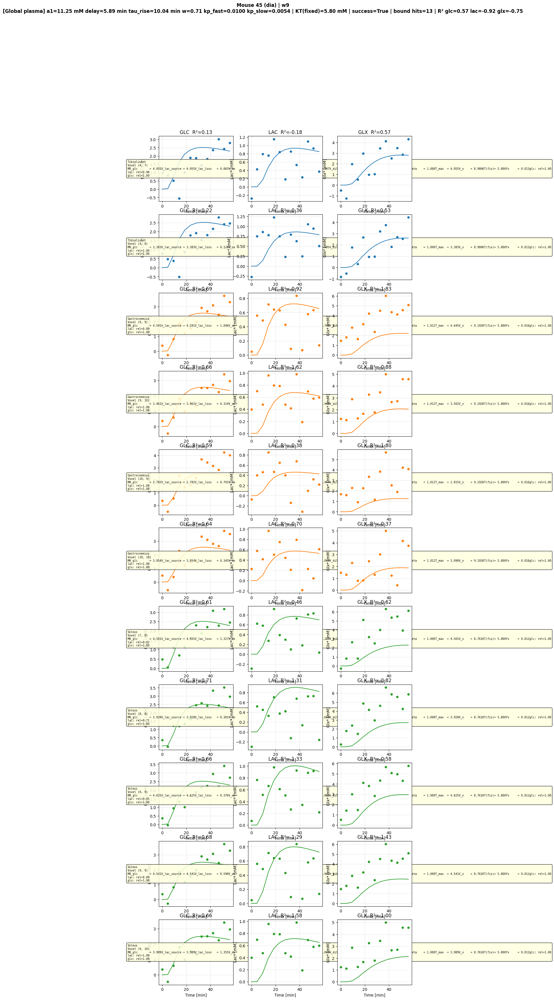

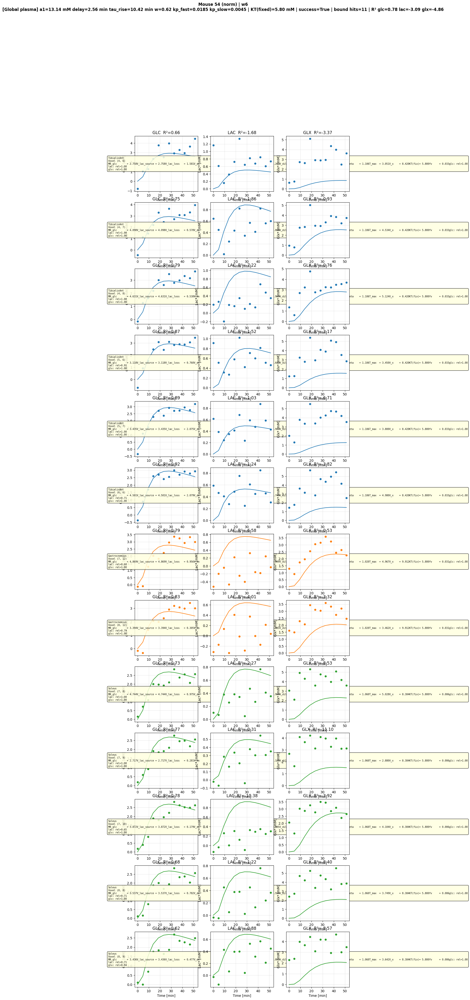

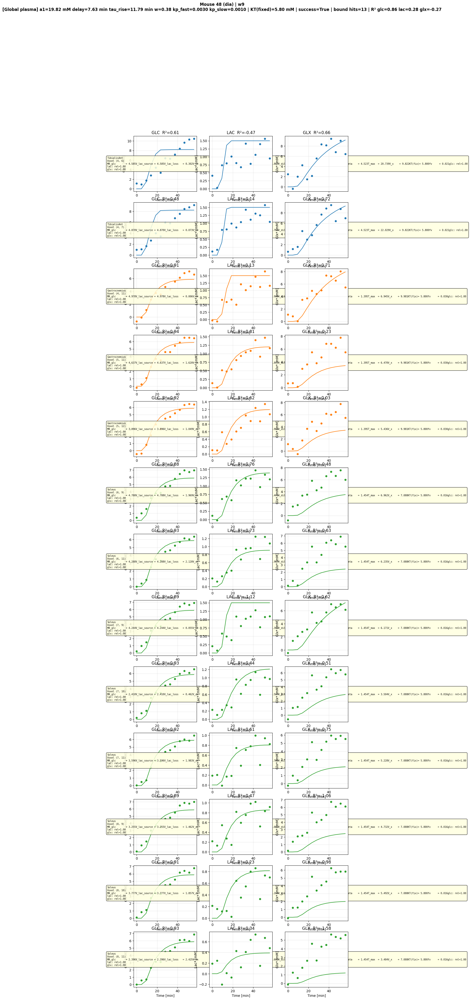

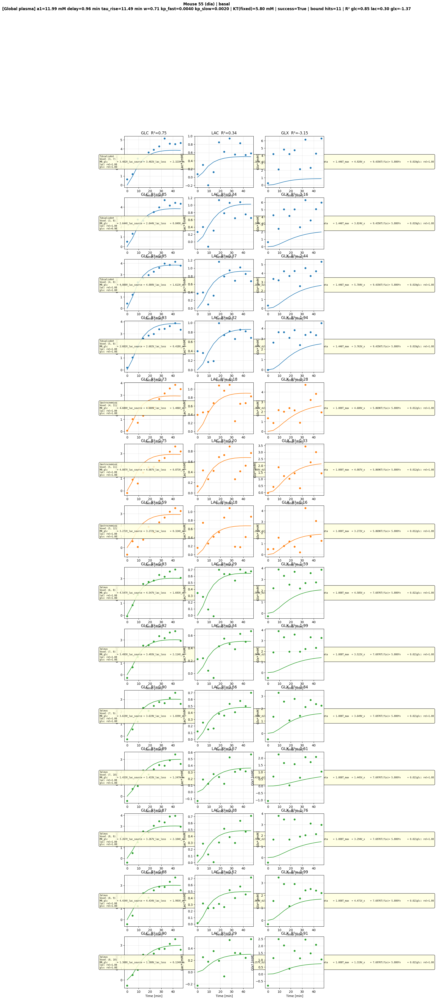

...

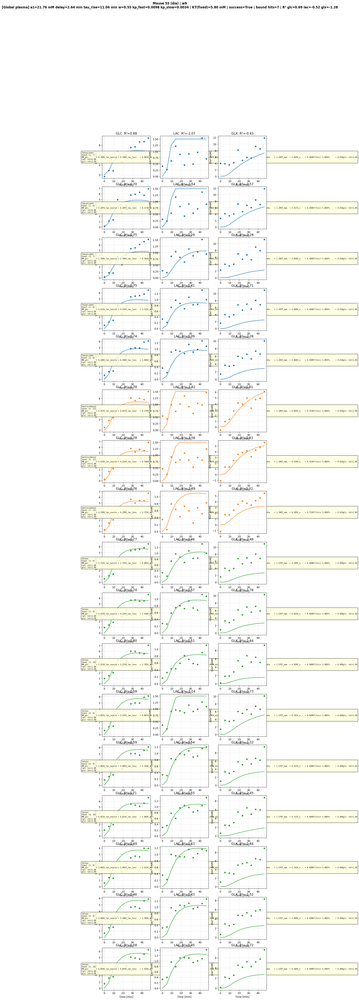

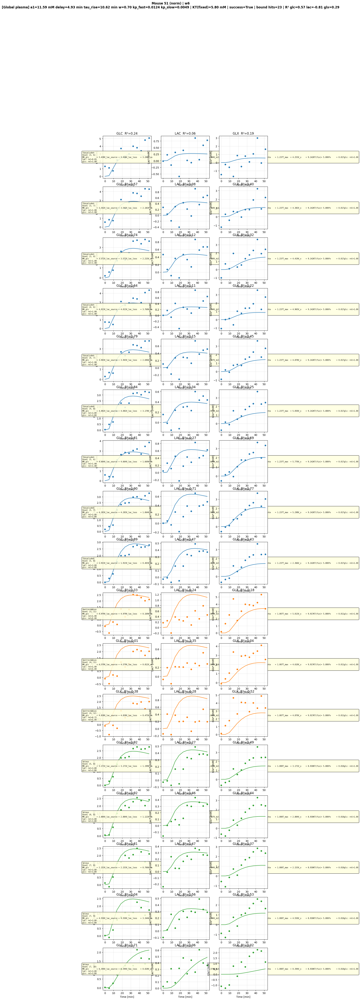

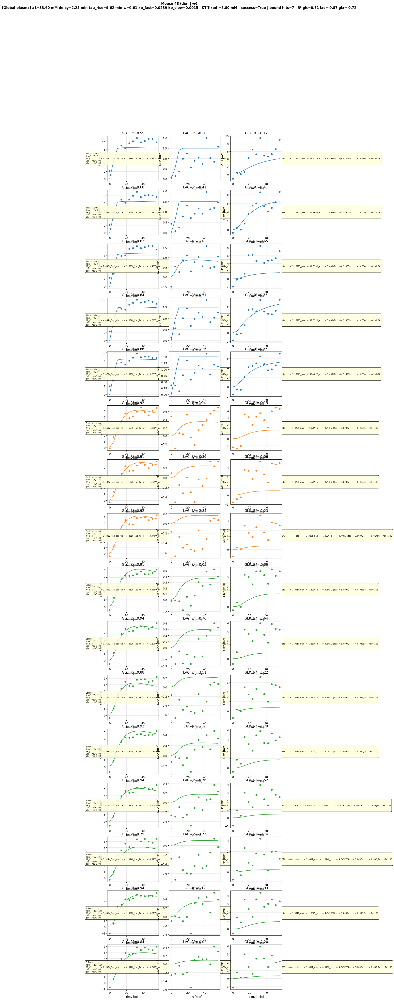

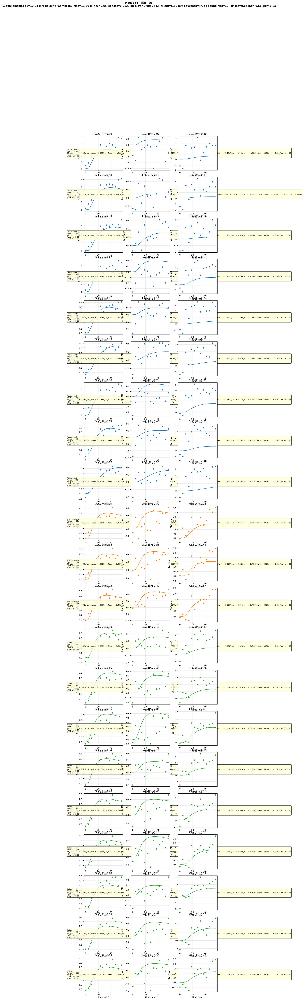

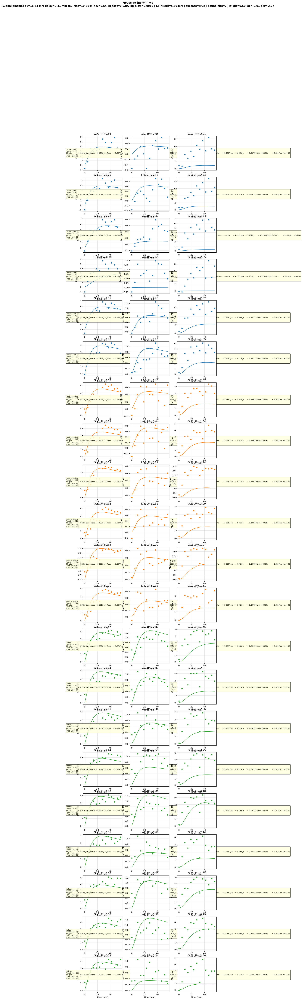

Time-course plots saved to /home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC/plotsC6_joint_plasma_oxDilution_KTfixed/


In [5]:
# Reload from disk if the heavy cell above was skipped, then build summaries.
results_path_p2 = DATA_DIR / RESULTS_FILENAME
if 'all_results' not in globals():
    all_results = joblib.load(results_path_p2) if results_path_p2.exists() else []

summary_results = [
    result for result in all_results if result.get('include_in_summary', result.get('success', True))
]
excluded_results = [
    result for result in all_results if not result.get('include_in_summary', result.get('success', True))
]

MET_LABELS = {'glc': 'Glc* [mM]', 'lac': 'Lac* [mM]', 'glx': 'Glx* [mM]'}
plots_dir = DATA_DIR / 'plotsC6_joint_plasma_oxDilution_KTfixed'
plots_dir.mkdir(exist_ok=True)

TISSUE_COLORS = {'TibialisAnt': 'C0', 'Gastrocnemius': 'C1', 'Soleus': 'C2'}
METS = ('glc', 'lac', 'glx')

def format_mean_r2(result):
    diag = result.get('diagnostics', {})
    mean_r2 = diag.get('mean_r2_by_met', {})
    if not mean_r2:
        return 'R² unavailable'
    return (
        f"R² glc={mean_r2.get('glc', float('nan')):.2f} "
        f"lac={mean_r2.get('lac', float('nan')):.2f} "
        f"glx={mean_r2.get('glx', float('nan')):.2f}"
    )

def get_plasma_annotation_global(result):
    diag = result.get('diagnostics', {})
    return (
        f"[Global plasma] a1={result.get('a1', float('nan')):.2f} mM"
        f" delay={result.get('plasma_delay_min', float('nan')):.2f} min"
        f" tau_rise={result.get('plasma_tau_rise', float('nan')):.2f} min"
        f" w={result.get('plasma_w', float('nan')):.2f}"
        f" kp_fast={result.get('kp_fast', float('nan')):.4f}"
        f" kp_slow={result.get('kp_slow', float('nan')):.4f}"
        f" | KT(fixed)={mf.KT_FIXED_MM:.2f} mM"
        f" | success={result.get('success', False)}"
        f" | bound hits={diag.get('bound_hit_count', 0)}"
        f" | {format_mean_r2(result)}"
    )

def plot_timecourse_multi(result, save_dir=plots_dir, show=False):
    """Plot per-voxel time courses (obs vs model) for one (mouse, week) joint fit.

    C6 plot routine with oxidative/dilution parameter annotations.
    """
    mid = result['mouseID']
    wk = result['week']
    grp = result['group']
    plasma_str = get_plasma_annotation_global(result)

    all_voxel_rows = []
    for tissue_name, tdata in result['tissues'].items():
        for voxel_result in tdata['voxels']:
            all_voxel_rows.append((tissue_name, tdata, voxel_result))
    if not all_voxel_rows:
        return

    n_voxels = len(all_voxel_rows)
    fig, axes = plt.subplots(n_voxels, len(METS), figsize=(13, 3.5 * n_voxels), sharey=False, squeeze=False)
    for row_idx, (tissue_name, tdata, vr) in enumerate(all_voxel_rows):
        color = TISSUE_COLORS.get(tissue_name, f'C{row_idx}')
        t = vr['voxel_data']['time_min']
        for col_idx, key in enumerate(METS):
            ax = axes[row_idx, col_idx]
            obs = vr['voxel_data'][key]
            ax.scatter(t, obs, color=color, s=25, zorder=3)
            if vr['pred'] is not None:
                ax.plot(t, vr['pred'][key], color=color, linewidth=1.5, zorder=2)
            ax.set_xlabel('Time [min]')
            ax.set_ylabel(MET_LABELS[key])
            ax.set_title(f'{key.upper()}  R²={vr["r2_" + key]:.2f}')
            ax.grid(True, alpha=0.3)
        quality_text = []
        for key in METS:
            quality = mf.summarize_channel_quality(vr['voxel_data'][key], key)
            quality_text.append(f'{key}: rel={quality["reliability"]:.2f}')
        param_text = (
            f'{tissue_name}\n'
            f'Voxel {vr["coords"]}\n'
            f'MR_glc       = {vr["MR_glc"]:.3f}'
            f'V_lac_source = {vr["V_lac_source"]:.3f}'
            f'V_lac_loss   = {vr["V_lac_loss"]:.3f}'
            f'V_ox         = {vr["V_ox"]:.3f}'
            f'phi_tca      = {vr["phi_tca"]:.3f}'
            f'V_TCA_total  = {vr["V_TCA_total"]:.3f}'
            f'V_dil_tca    = {vr["V_dil_tca"]:.3f}'
            f'ox_ratio     = {vr["V_ox_feasibility_ratio"]:.3f}'
            f'---------'
            f'eta    = {tdata["eta"]:.3f}'
            f'T_max  = {vr["T_max"]:.3f}'
            f'V_x    = {tdata["V_x"]:.3f}'
            f'KT(fix)= {tdata["KT"]:.3f}'
            f'fv     = {tdata["fv"]:.3f}'
            + '\n'.join(quality_text)
        )
        axes[row_idx, 0].text(
            -0.42, 0.5, param_text,
            transform=axes[row_idx, 0].transAxes,
            fontsize=7, va='center', ha='left', family='monospace',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='lightyellow', alpha=0.85),
        )
    fig.suptitle(f'Mouse {mid} ({grp}) | {wk}\n' + plasma_str, fontsize=12, fontweight='bold', y=1.001)
    plt.tight_layout()
    plt.subplots_adjust(left=0.22)
    fname = save_dir / f'tc_mouse{mid}_{wk}.png'
    plt.savefig(fname, dpi=100, bbox_inches='tight')
    if show:
        plt.show()
    plt.close(fig)


print(f'Loaded {len(all_results)} joint results; using {len(summary_results)} successful results for summaries.')

N_mouse_week_tissues = 0
for result in all_results:
    N_mouse_week_tissues += len(result['tissues'])

print(f'Fitted {N_mouse_week_tissues} mouse-week-tissue combinations across both phases.')
if excluded_results:
    excluded_labels = [f"mouse {r['mouseID']} {r['week']}" for r in excluded_results]
    print('Excluded from summary:', ', '.join(excluded_labels))

print(f'Plotting time-course fits for {len(summary_results)} successful (mouse, week) results...')
for result in summary_results:
    plot_timecourse_multi(result, save_dir=plots_dir, show=True)
print(f'Time-course plots saved to {plots_dir}/')


Plotting tissue-grouped time-course fits for 13 results...


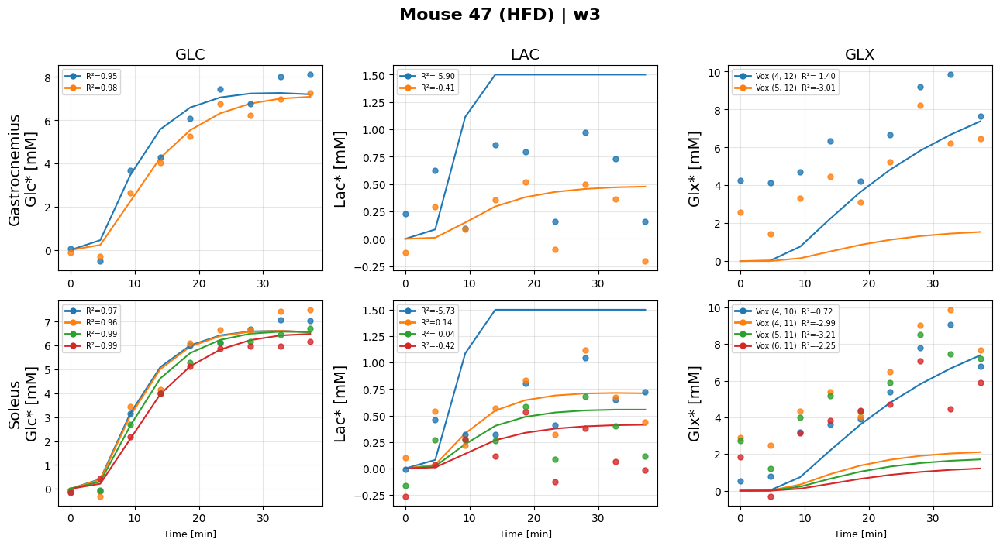

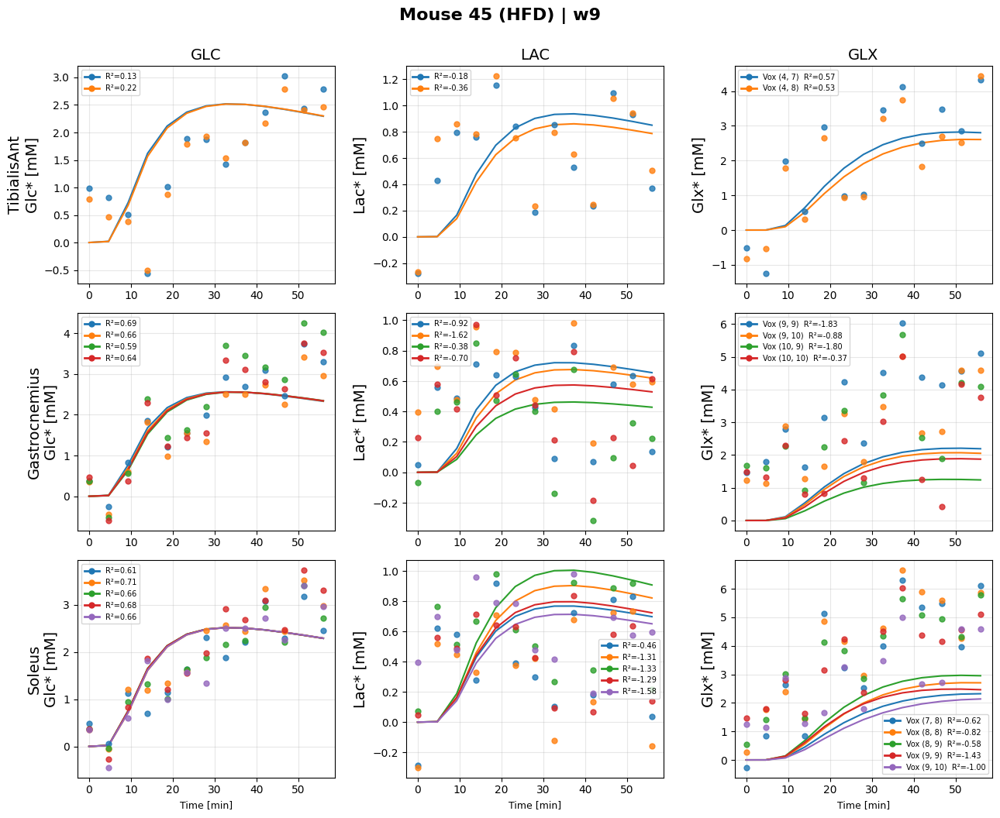

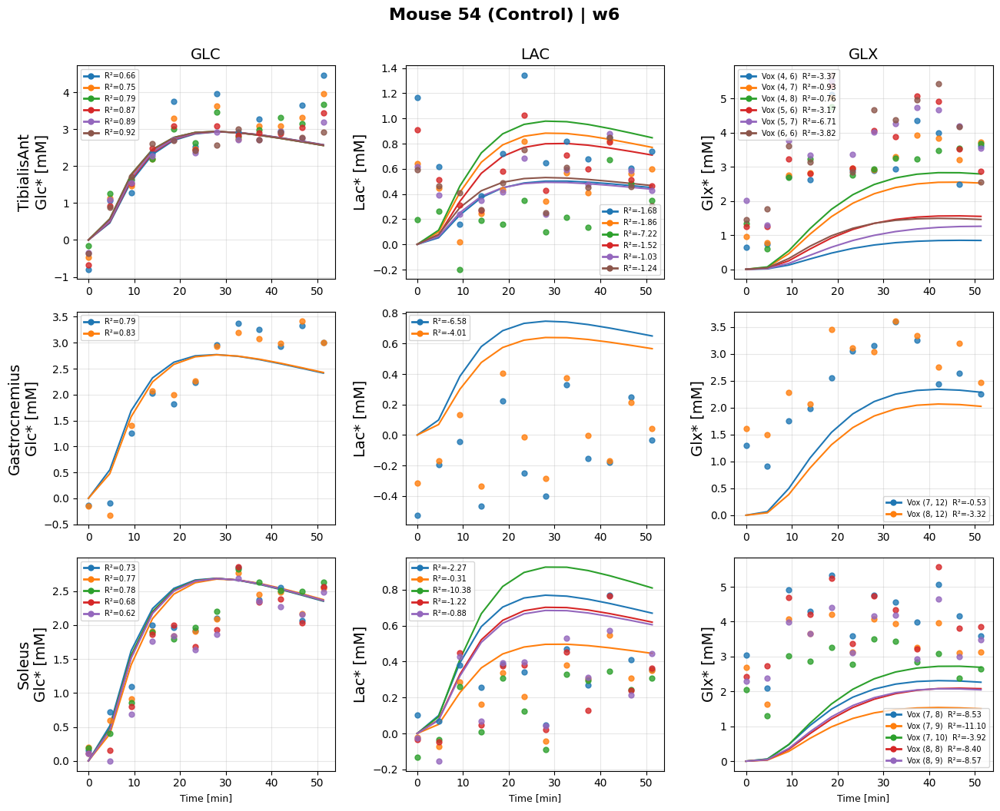

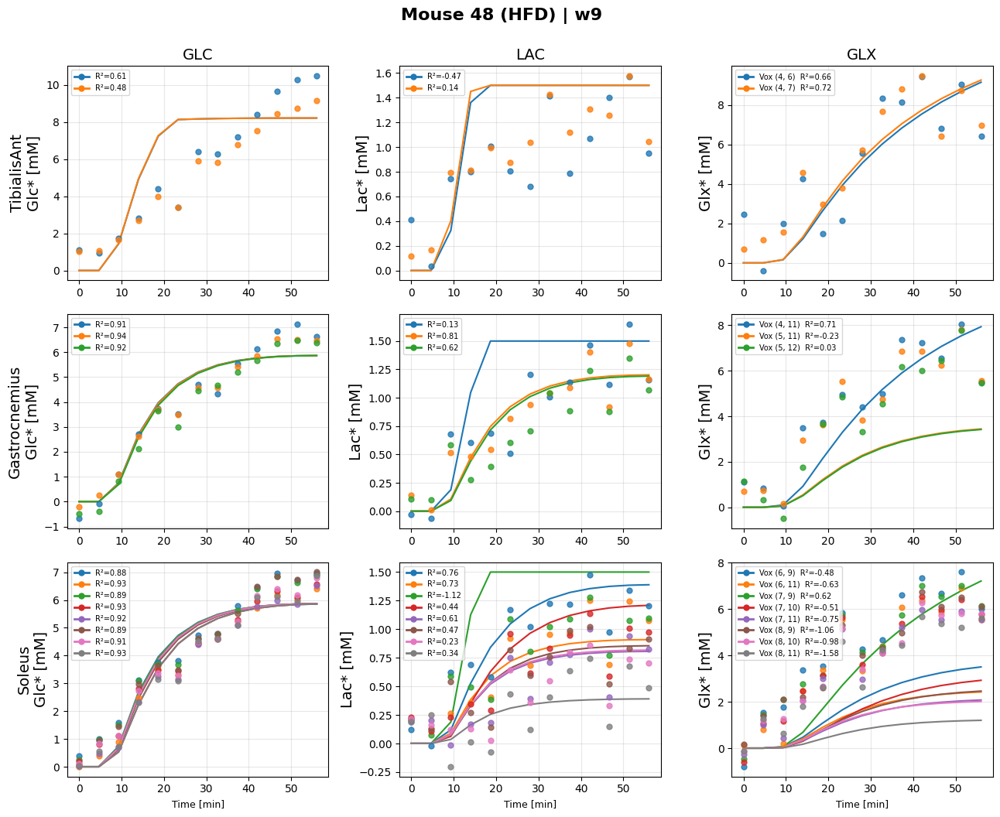

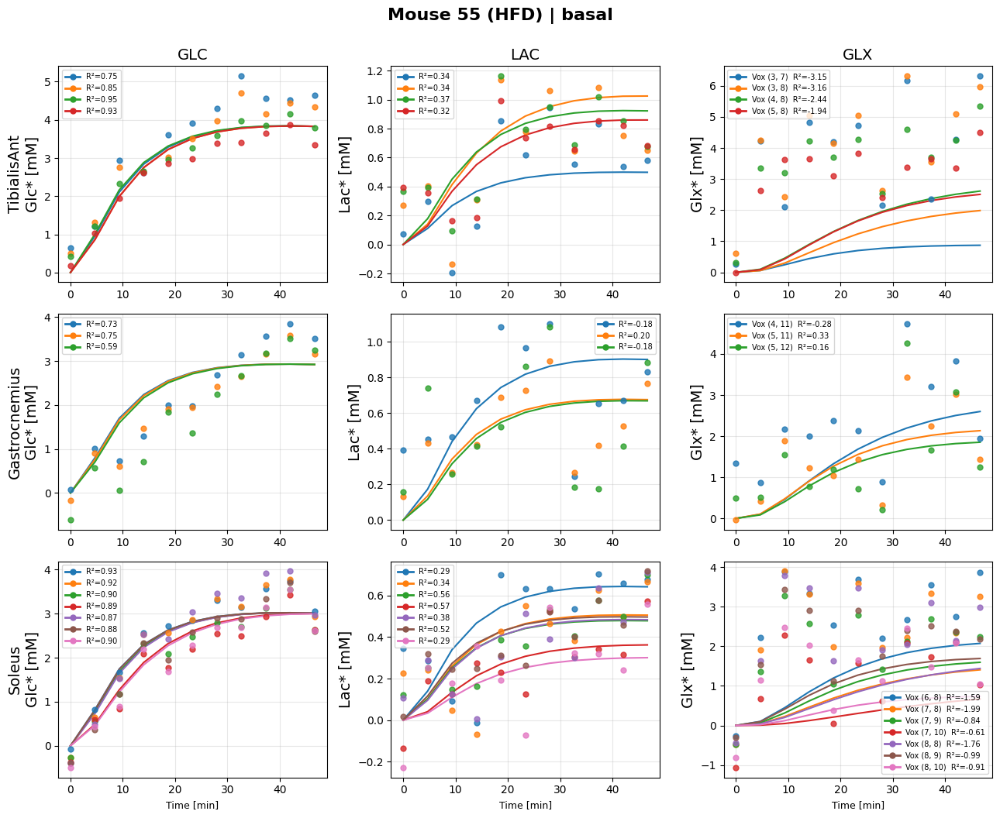

...

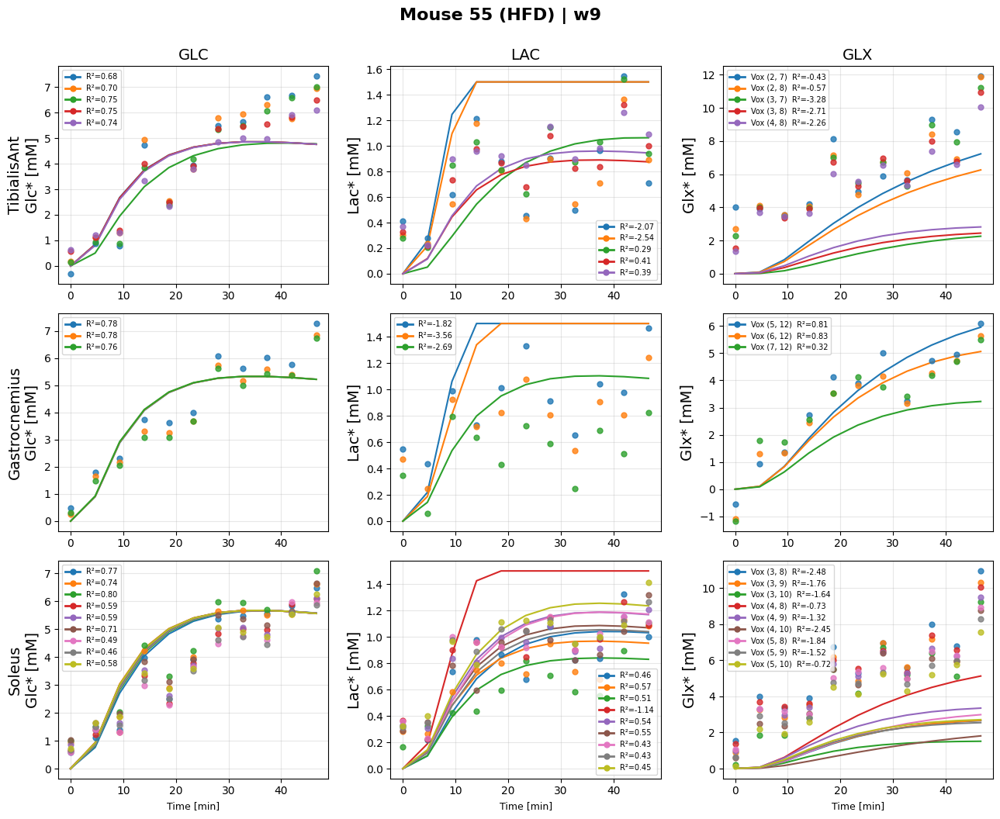

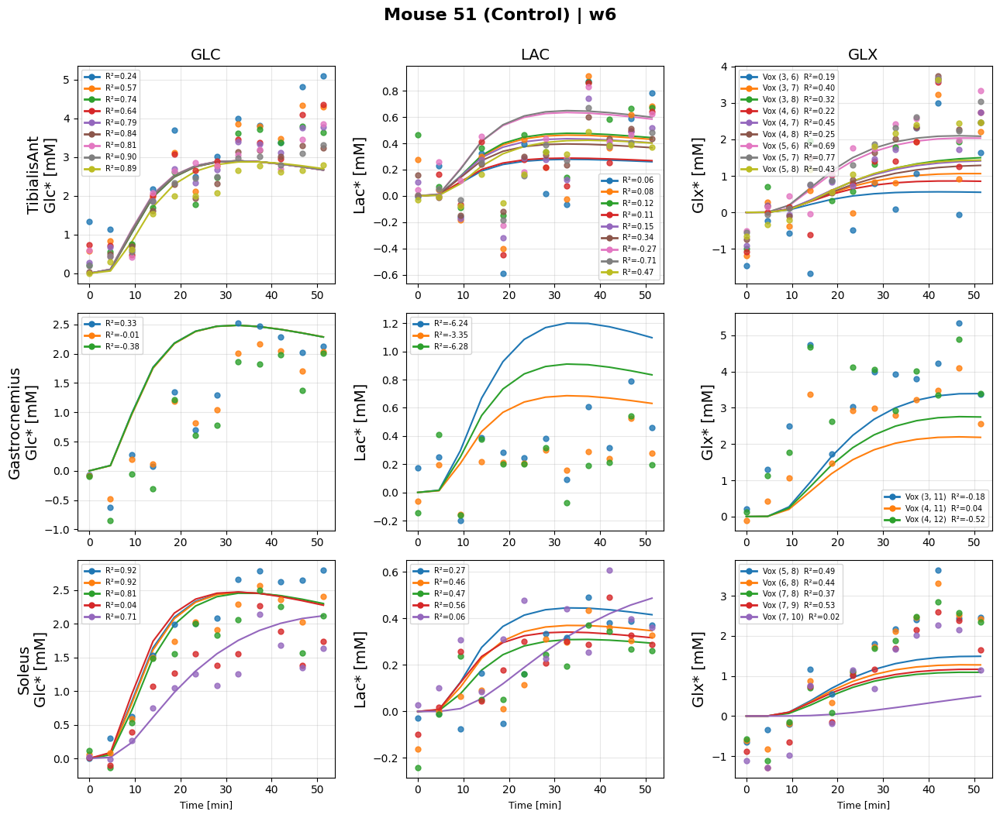

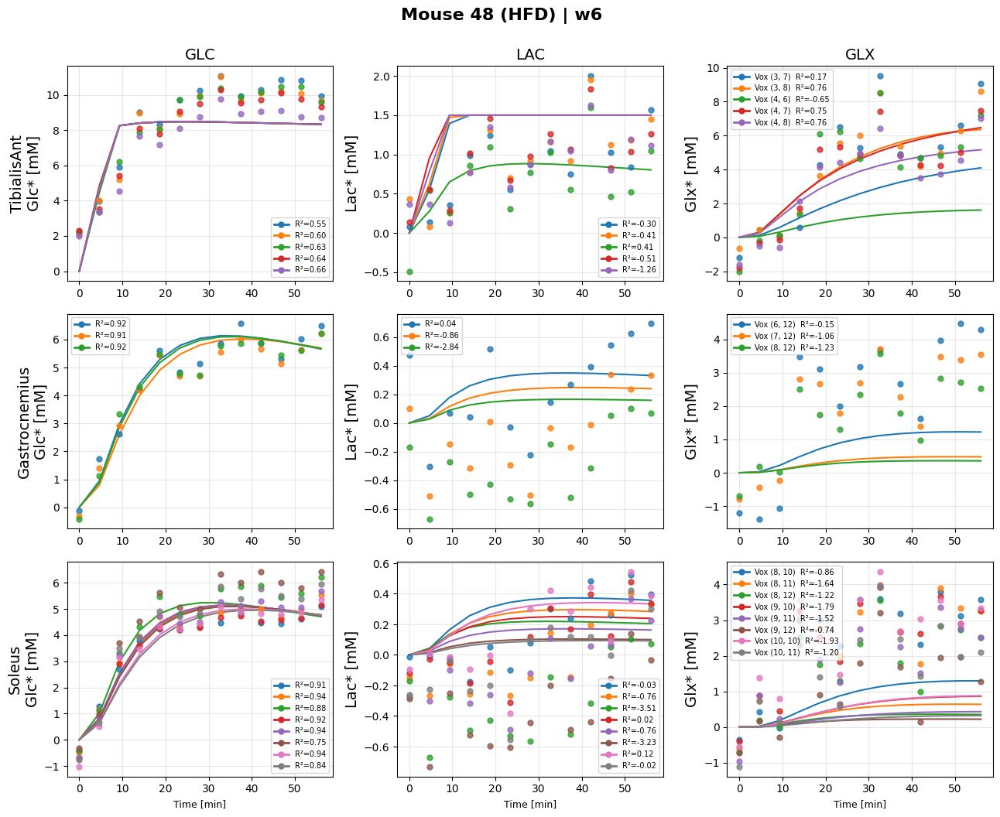

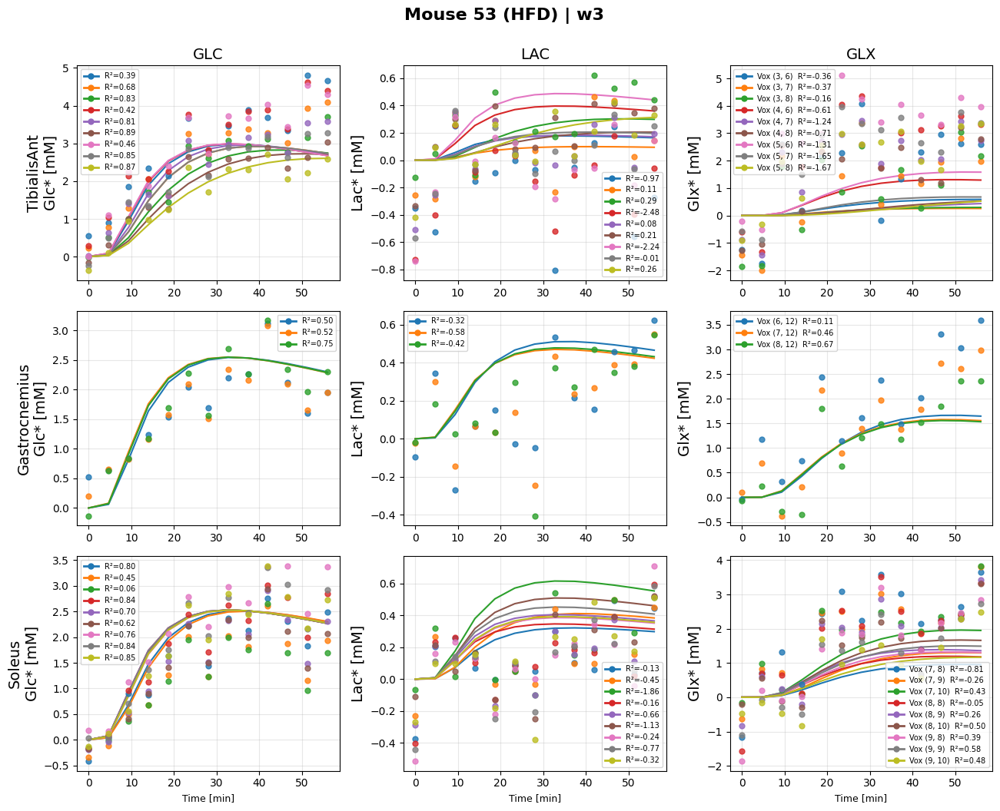

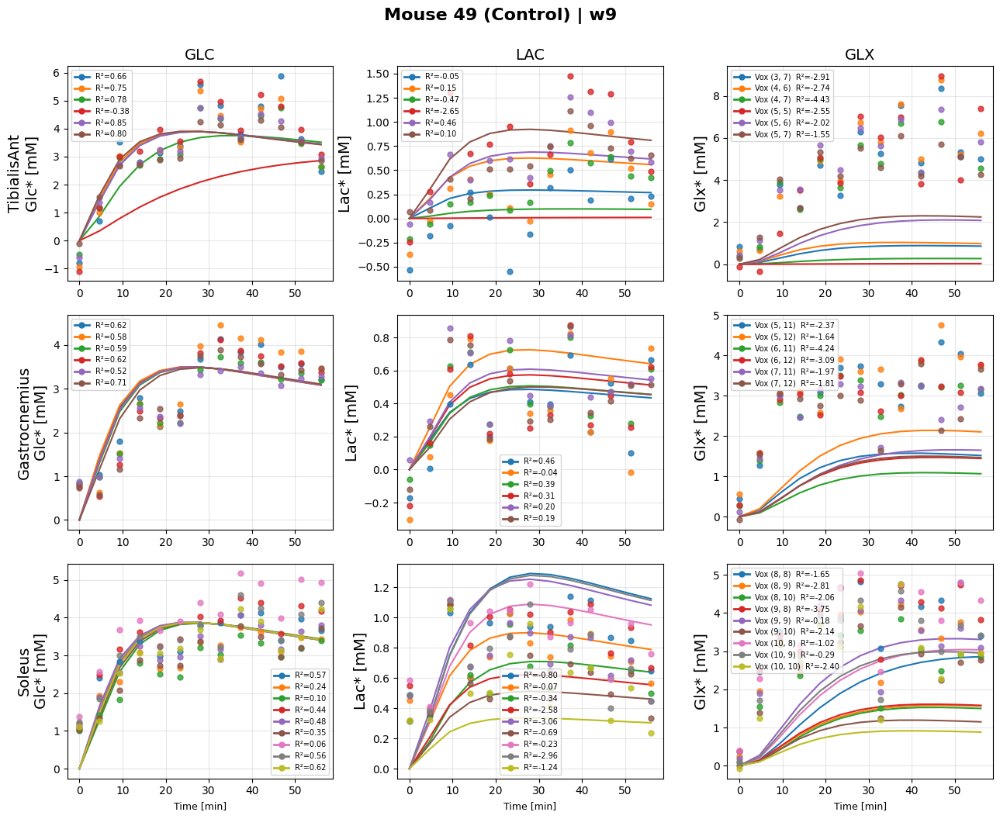

Tissue-grouped plots saved to /home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC/plotsC6_joint_plasma_oxDilution_KTfixed/


In [6]:
# ============================================================
# TISSUE-GROUPED TIME-COURSE PLOTS
# ============================================================
# Purpose: same per-(mouse, week) iteration as `plot_timecourse_multi` above,
# but reorganise the subplot grid so that:
#   - Each ROW = one tissue (TibialisAnt / Gastrocnemius / Soleus) → 3 rows total
#   - Each COLUMN = one metabolite (glc / lac / glx) → 3 columns total
#   - Within each subplot: all voxels of that tissue are OVERLAID on the same
#     axes using distinct colours rather than separate rows.
#   - The legend of each subplot lists every voxel with its coordinates and the
#     per-metabolite R² for that voxel.
#
# Compared with `plot_timecourse_multi`:
#   - Removed: one row per voxel, left-hand parameter text box.
#   - Added: multi-voxel overlay within each tissue row, per-voxel R² in legend.
#
# Data layout (from Phase-2 result dict):
#   result['tissues'][tissue_name]['voxels']  → list of per-voxel dicts (vr)
#   vr['voxel_data'][key]                     → observed time series (key ∈ METS)
#   vr['pred'][key]                           → model-predicted time series
#   vr['r2_' + key]                           → coefficient of determination R²
#   vr['coords']                              → (i, j, k) voxel coordinates
#   vr['voxel_data']['time_min']              → acquisition times in minutes
# ============================================================

def plot_timecourse_by_tissue(result, save_dir=plots_dir, show=False):
    """Per-(mouse, week) figure: 3-tissue × 3-metabolite grid with voxel overlay.

    Each row corresponds to one tissue; within a row all voxels are plotted
    on the same axes with distinct colours.  Legend entries show voxel
    coordinates and the R² value for that metabolite.
    """
    mid = result['mouseID']
    wk  = result['week']
    grp = result['group']

    # Reuse the global-plasma annotation string from the highlighted cell so
    # both plots carry identical fitting-quality metadata in the title.
    plasma_str = get_plasma_annotation_global(result)

    # Preserve the canonical tissue order from the companion module; skip any
    # tissue that was not fitted in this (mouse, week) pair.
    tissues_present = [t for t in TISSUES if t in result['tissues']]
    n_tissues = len(tissues_present)
    if n_tissues == 0:
        return   # nothing to plot

    # --- Figure layout -------------------------------------------------
    # n_tissues rows × len(METS) columns; squeeze=False ensures axes is always 2-D.
    fig, axes = plt.subplots(
        n_tissues, len(METS),
        figsize=(13, 3.5 * n_tissues),
        sharey=False, squeeze=False,
    )

    # --- Fill each subplot ---------------------------------------------
    for row_idx, tissue_name in enumerate(tissues_present):
        tdata  = result['tissues'][tissue_name]
        voxels = tdata['voxels']   # list of per-voxel result dicts

        # Assign a distinct colour to each voxel within this tissue.
        # matplotlib's default cycle (C0, C1, …) provides up to 10 contrasting
        # colours, which is more than enough for typical voxel counts (1–4).
        voxel_colors = [f'C{i}' for i in range(len(voxels))]

        for col_idx, key in enumerate(METS):
            ax = axes[row_idx, col_idx]
            legend_handles = []

            for vox_idx, vr in enumerate(voxels):
                color = voxel_colors[vox_idx]
                t     = vr['voxel_data']['time_min']
                obs   = vr['voxel_data'][key]
                r2    = vr[f'r2_{key}']

                # Scatter: observed DMI signal for this voxel / metabolite.
                ax.scatter(t, obs, color=color, s=25, zorder=3, alpha=0.8)

                # Line: ODE model prediction (None if optimisation failed).
                if vr['pred'] is not None:
                    ax.plot(t, vr['pred'][key], color=color, linewidth=1.5, zorder=2)

                # Build a legend handle that encodes voxel identity and R².
                # The handle mimics the plotted style (line + marker).
                
                if col_idx == len(METS) - 1:  # only include voxel coords in the last column to avoid clutter
                    label = f'Vox {vr["coords"]}  R²={r2:.2f}'
                else:
                    label = f'R²={r2:.2f}'
                legend_handles.append(
                    plt.Line2D(
                        [0], [0], color=color, linewidth=2,
                        marker='o', markersize=5, label=label,
                    )
                )

            # Place the legend inside the subplot; 'best' avoids data overlap.
            ax.legend(handles=legend_handles, fontsize=7, loc='best')
            
            # ax.set_xlabel('Time [min]')
            if row_idx == n_tissues - 1:  # only set x-labels on the bottom row
                ax.set_xlabel('Time [min]', fontsize=9)
            
            # ax.set_ylabel(MET_LABELS[key])
            if col_idx == 0:
                ax.set_ylabel(f'{tissue_name}\n{MET_LABELS[key]}', fontsize=14)
            else:
                ax.set_ylabel(MET_LABELS[key], fontsize=14)

            # ax.set_title(f'{tissue_name} | {key.upper()}')
            if row_idx == 0:
                ax.set_title(f'{key.upper()}', fontsize=14)
            ax.grid(True, alpha=0.3)

    # --- Figure title --------------------------------------------------
    # fig.suptitle(
    #     f'Mouse {mid} ({grp}) | {wk}\n' + plasma_str,
    #     fontsize=12, fontweight='bold', y=1.001,
    # )
    fig.suptitle(
        f'Mouse {mid} ({grp}) | {wk}'.replace('dia', 'HFD').replace('norm', 'Control'),
        fontsize=16, fontweight='bold', y=1.001,
    )
    plt.tight_layout()

    # --- Save ----------------------------------------------------------
    # Filename convention mirrors `plot_timecourse_multi` but prefixed with
    # 'tc_bytissue_' to avoid overwriting the per-voxel plots.
    fname = save_dir / f'tc_bytissue_mouse{mid}_{wk}.png'
    plt.savefig(fname, dpi=100, bbox_inches='tight')
    if show:
        plt.show()
    plt.close(fig)
    
    


# Run over all successful (mouse, week) results, mirroring the call pattern
# of `plot_timecourse_multi` in the highlighted cell.
print(f'Plotting tissue-grouped time-course fits for {len(summary_results)} results...')
for result in summary_results:
    plot_timecourse_by_tissue(result, save_dir=plots_dir, show=True)
    # break
print(f'Tissue-grouped plots saved to {plots_dir}/')


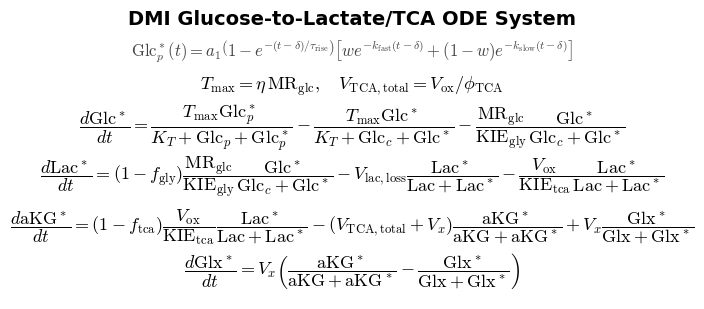

Saved to /home/pty/work/project_MRI/extract_MRI_metabolite_concentration_and_fitting/model_fittingC/fig_ODE_system_C6.png


In [7]:
# Render the C6 DMI metabolic flux ODE system as a figure image.
#
# This cell is intentionally self-contained so the manuscript model diagram can
# be regenerated by rerunning only this notebook cell. The equations mirror the
# implementation in model_fittingC6_improved.py.

import matplotlib
import matplotlib.pyplot as plt
from pathlib import Path

matplotlib.rcParams['mathtext.fontset'] = 'cm'

_out_dir = PLOTS_DIR if 'PLOTS_DIR' in dir() else NOTEBOOK_DIR
_out_dir.mkdir(parents=True, exist_ok=True)

_plasma_eq = (
    r'$\mathrm{Glc}_p^*(t) = a_1\left(1-e^{-(t-\delta)/\tau_{\mathrm{rise}}}\right)'
    r'\left[w e^{-k_{\mathrm{fast}}(t-\delta)} + (1-w)e^{-k_{\mathrm{slow}}(t-\delta)}\right]$'
)

_equations = [
    (r'$T_{\max}=\eta\,\mathrm{MR}_{\mathrm{glc}},\quad '
     r'V_{\mathrm{TCA,total}}=V_{\mathrm{ox}}/\phi_{\mathrm{TCA}}$'),
    (r'$\dfrac{d\mathrm{Glc}^*}{dt}=\dfrac{T_{\max}\mathrm{Glc}_p^*}{K_T+\mathrm{Glc}_p+\mathrm{Glc}_p^*}'
     r'-\dfrac{T_{\max}\mathrm{Glc}^*}{K_T+\mathrm{Glc}_c+\mathrm{Glc}^*}'
     r'-\dfrac{\mathrm{MR}_{\mathrm{glc}}}{\mathrm{KIE}_{\mathrm{gly}}}\dfrac{\mathrm{Glc}^*}{\mathrm{Glc}_c+\mathrm{Glc}^*}$'),
    (r'$\dfrac{d\mathrm{Lac}^*}{dt}=(1-f_{\mathrm{gly}})\dfrac{\mathrm{MR}_{\mathrm{glc}}}{\mathrm{KIE}_{\mathrm{gly}}}\dfrac{\mathrm{Glc}^*}{\mathrm{Glc}_c+\mathrm{Glc}^*}'
     r'-V_{\mathrm{lac,loss}}\dfrac{\mathrm{Lac}^*}{\mathrm{Lac}+\mathrm{Lac}^*}'
     r'-\dfrac{V_{\mathrm{ox}}}{\mathrm{KIE}_{\mathrm{tca}}}\dfrac{\mathrm{Lac}^*}{\mathrm{Lac}+\mathrm{Lac}^*}$'),
    (r'$\dfrac{d\mathrm{aKG}^*}{dt}=(1-f_{\mathrm{tca}})\dfrac{V_{\mathrm{ox}}}{\mathrm{KIE}_{\mathrm{tca}}}\dfrac{\mathrm{Lac}^*}{\mathrm{Lac}+\mathrm{Lac}^*}'
     r'-(V_{\mathrm{TCA,total}}+V_x)\dfrac{\mathrm{aKG}^*}{\mathrm{aKG}+\mathrm{aKG}^*}'
     r'+V_x\dfrac{\mathrm{Glx}^*}{\mathrm{Glx}+\mathrm{Glx}^*}$'),
    (r'$\dfrac{d\mathrm{Glx}^*}{dt}=V_x\left(\dfrac{\mathrm{aKG}^*}{\mathrm{aKG}+\mathrm{aKG}^*}-\dfrac{\mathrm{Glx}^*}{\mathrm{Glx}+\mathrm{Glx}^*}\right)$'),
]

fig, ax = plt.subplots(figsize=(7.2, 3.2))
ax.axis('off')
ax.text(0.5, 0.95, _plasma_eq, fontsize=12, ha='center', va='center', transform=ax.transAxes, color='#444444')
for eq, y in zip(_equations, [0.82, 0.66, 0.47, 0.28, 0.11]):
    ax.text(0.5, y, eq, fontsize=13, ha='center', va='center', transform=ax.transAxes)
ax.set_title('DMI Glucose-to-Lactate/TCA ODE System', fontsize=14, fontweight='bold', pad=10)
plt.tight_layout()

_out_path = _out_dir / 'fig_ODE_system_C6.png'
plt.savefig(_out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved to {_out_path}')
